---
title: "Exploratory Data Analysis"
format:
    html: 
        code-fold: false
---

<!-- After digesting the instructions, you can delete this cell, these are assignment instructions and do not need to be included in your final submission.  -->

{{< include instructions.qmd >}} 

# Code 

In [4]:
import pandas as pd
import os

# Define file paths
data_files = {
    "Crude_Oil": "../../data/processed-data/Crude_Oil_cleaned.csv",
    "Dow_Jones": "../../data/processed-data/Dow_Jones_cleaned.csv",
    "Gold": "../../data/processed-data/Gold_cleaned.csv",
    "Government_Spending": "../../data/processed-data/Government_Spending_Breakdown.csv",
    "Macro_Series": "../../data/processed-data/macro_series_cleaned.csv",
    "Nasdaq": "../../data/processed-data/Nasdaq_cleaned.csv",
    "Personal_Info": "../../data/processed-data/personal_info_cleaned.csv",
    "SP500": "../../data/processed-data/S&P_500_cleaned.csv",
}

# Check file existence
for name, path in data_files.items():
    if not os.path.exists(path):
        print(f"File not found: {path}")

# Load datasets with error handling
dataframes = {}
for name, path in data_files.items():
    try:
        dataframes[name] = pd.read_csv(path)
        print(f"{name} loaded successfully with shape: {dataframes[name].shape}")
    except Exception as e:
        print(f"Failed to load {name}: {e}")

# Print summary of all tables
for name, df in dataframes.items():
    print(f"Table: {name}")
    print("=" * 50)
    print("Basic Info:")
    print(df.info())
    print("\nMissing Values:")
    print(df.isnull().sum())
    print("\nFirst 5 Rows:")
    print(df.head())
    print("=" * 50)


Crude_Oil loaded successfully with shape: (5847, 35)
Dow_Jones loaded successfully with shape: (5858, 35)
Gold loaded successfully with shape: (5843, 35)
Government_Spending loaded successfully with shape: (95, 4)
Macro_Series loaded successfully with shape: (299, 16)
Nasdaq loaded successfully with shape: (5858, 35)
Personal_Info loaded successfully with shape: (24, 11)
SP500 loaded successfully with shape: (5858, 35)
Table: Crude_Oil
Basic Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5847 entries, 0 to 5846
Data columns (total 35 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index             5847 non-null   object 
 1   Open              5847 non-null   float64
 2   High              5847 non-null   float64
 3   Low               5847 non-null   float64
 4   Close             5847 non-null   float64
 5   Volume            5847 non-null   float64
 6   MA_50             5847 non-null   float64
 7   MA_200       

Analyzing Crude_Oil


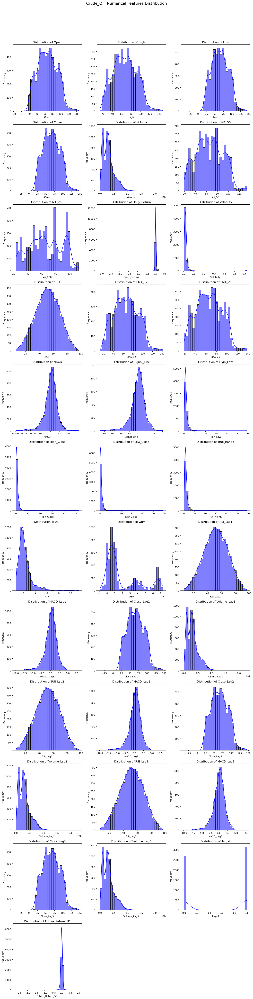

Analyzing Dow_Jones


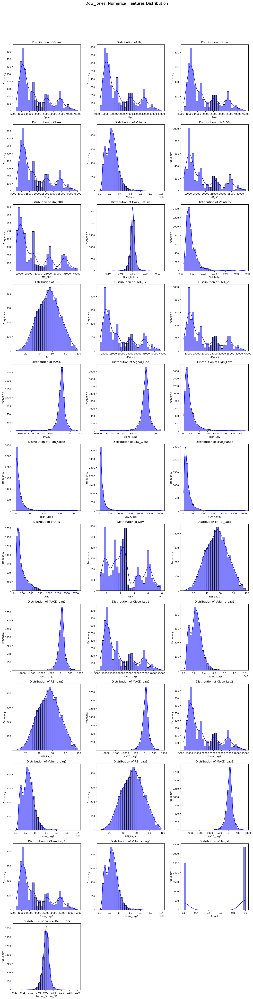

Analyzing Gold


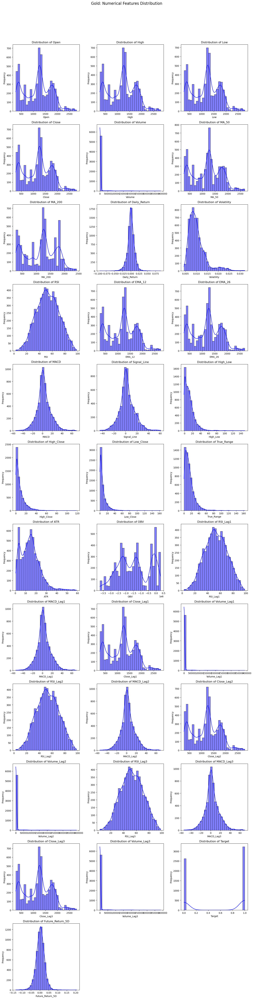

Analyzing Government_Spending


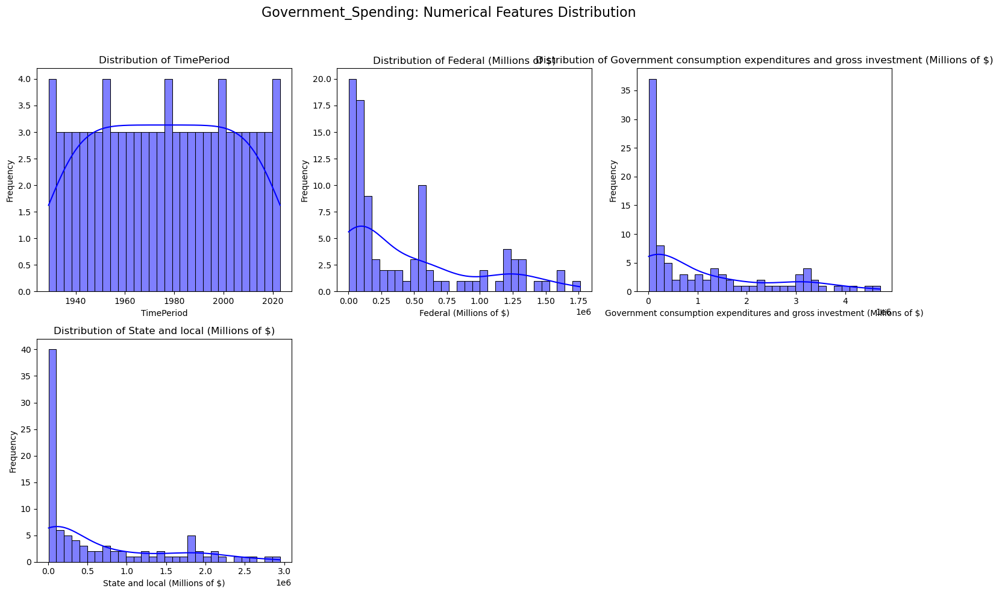

Analyzing Macro_Series


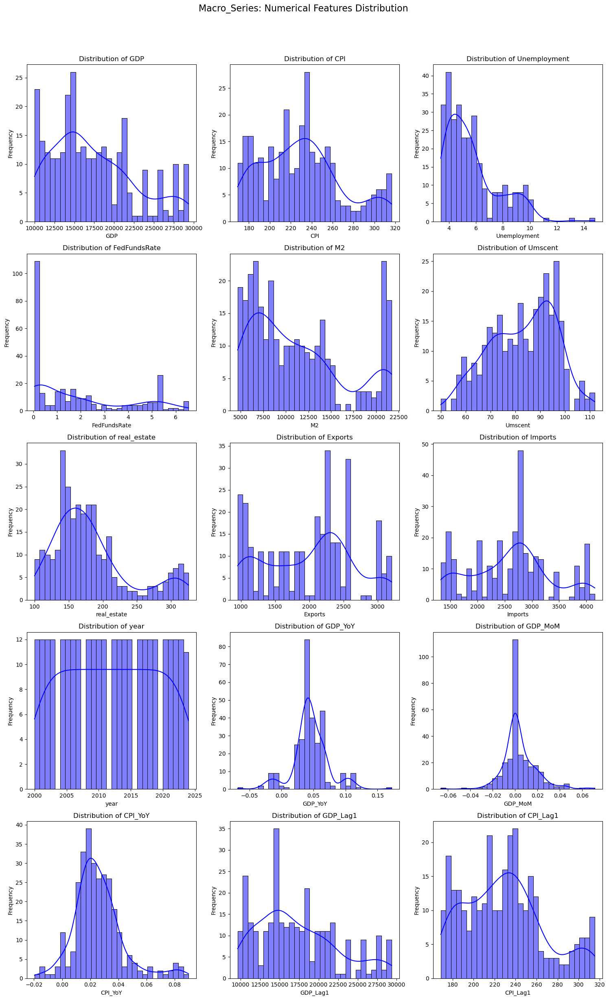

Analyzing Nasdaq


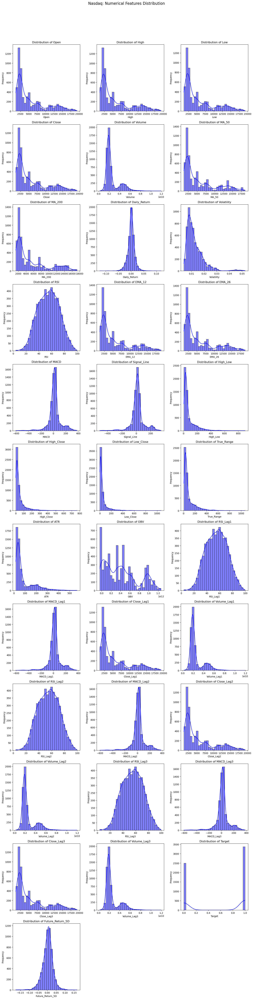

Analyzing Personal_Info


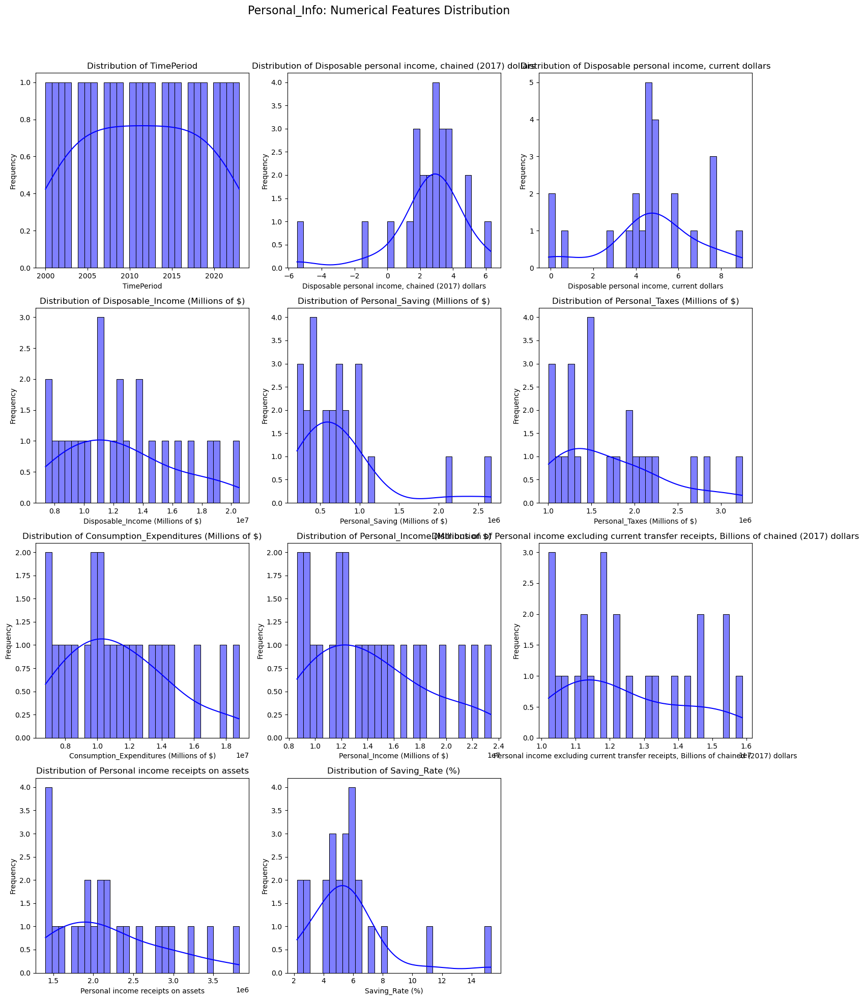

Analyzing SP500


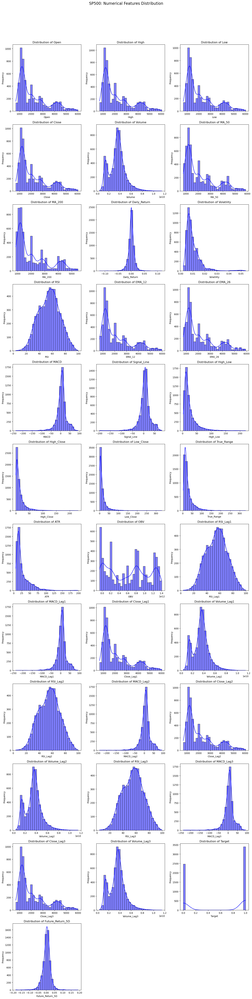

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
import math
import os

def plot_distributions(df, table_name, save_path):
    # Create the save directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)
    
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    n_cols = 3
    n_rows = math.ceil(len(numerical_columns) / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
    fig.suptitle(f"{table_name}: Numerical Features Distribution", fontsize=16)
    
    # Handle case where there's only one row (axes would be 1D)
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, col in enumerate(numerical_columns):
        row, col_pos = divmod(i, n_cols)
        sns.histplot(df[col], kde=True, bins=30, ax=axes[row, col_pos], color='blue', edgecolor='black')
        axes[row, col_pos].set_title(f"Distribution of {col}")
        axes[row, col_pos].set_xlabel(col)
        axes[row, col_pos].set_ylabel("Frequency")
    
    # Remove empty subplots
    for j in range(i + 1, n_rows * n_cols):
        row, col_pos = divmod(j, n_cols)
        fig.delaxes(axes[row, col_pos])
    
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    
# Path to save the plots
save_path = "/Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data/visualized-data"

# Generate and save plots for each dataframe
for name, df in dataframes.items():
    print(f"Analyzing {name}")
    plot_distributions(df, name, save_path)


Analyzing correlation for Crude_Oil


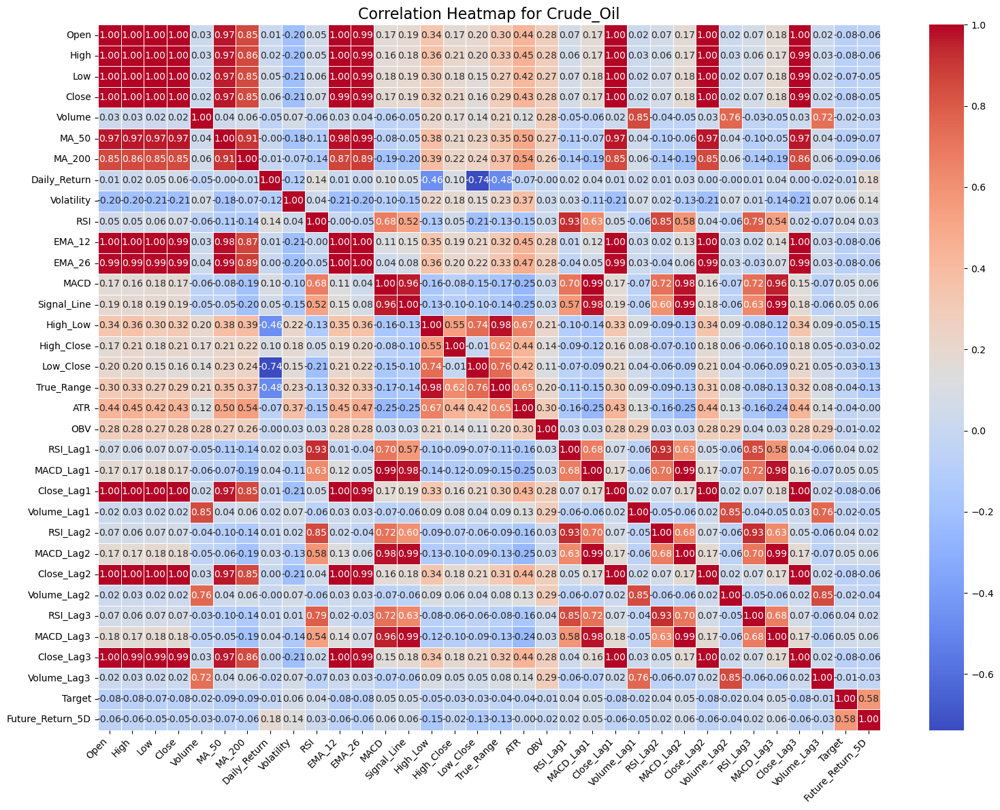


Analyzing correlation for Dow_Jones


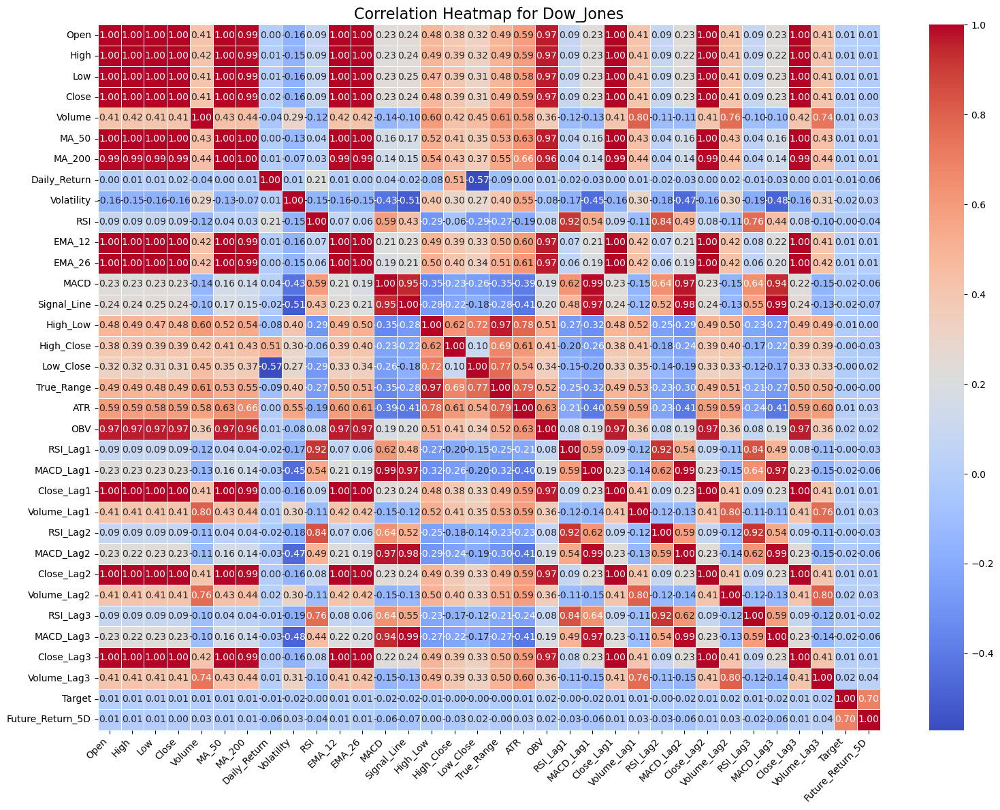


Analyzing correlation for Gold


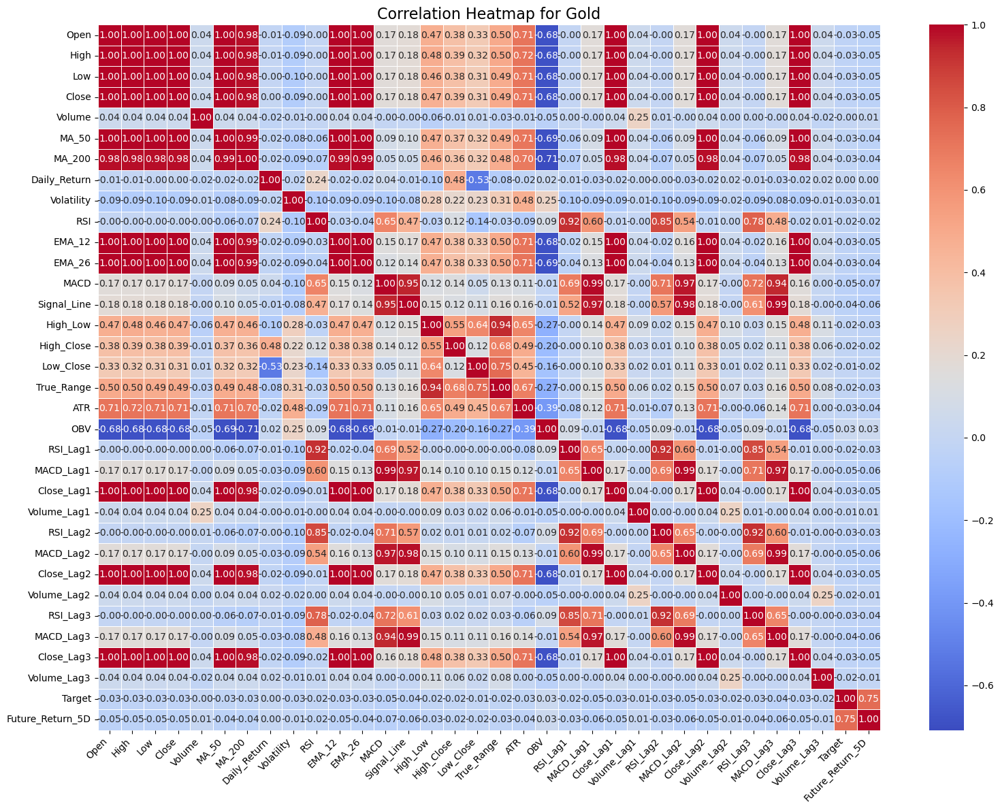


Analyzing correlation for Government_Spending


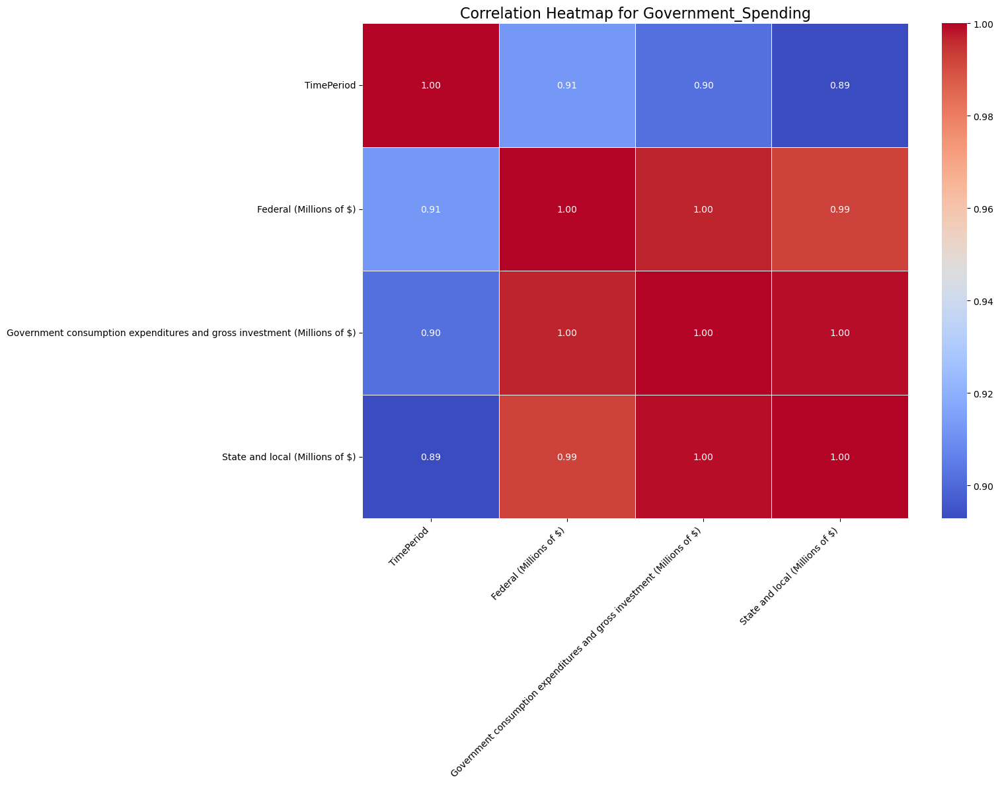


Analyzing correlation for Macro_Series


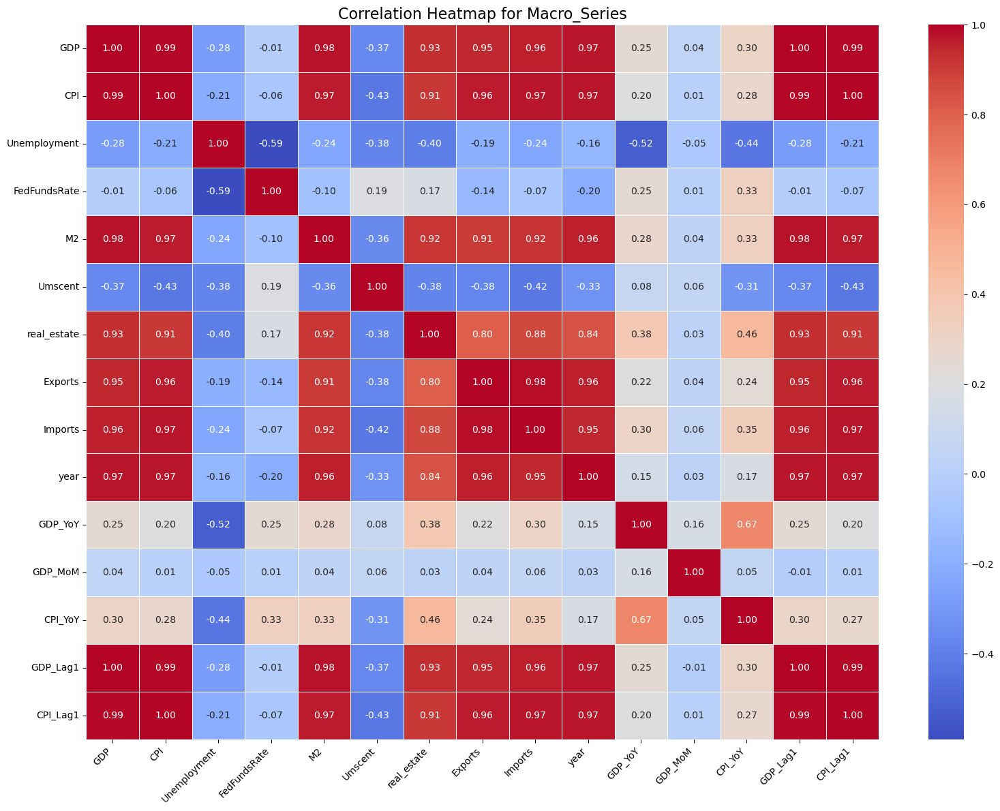


Analyzing correlation for Nasdaq


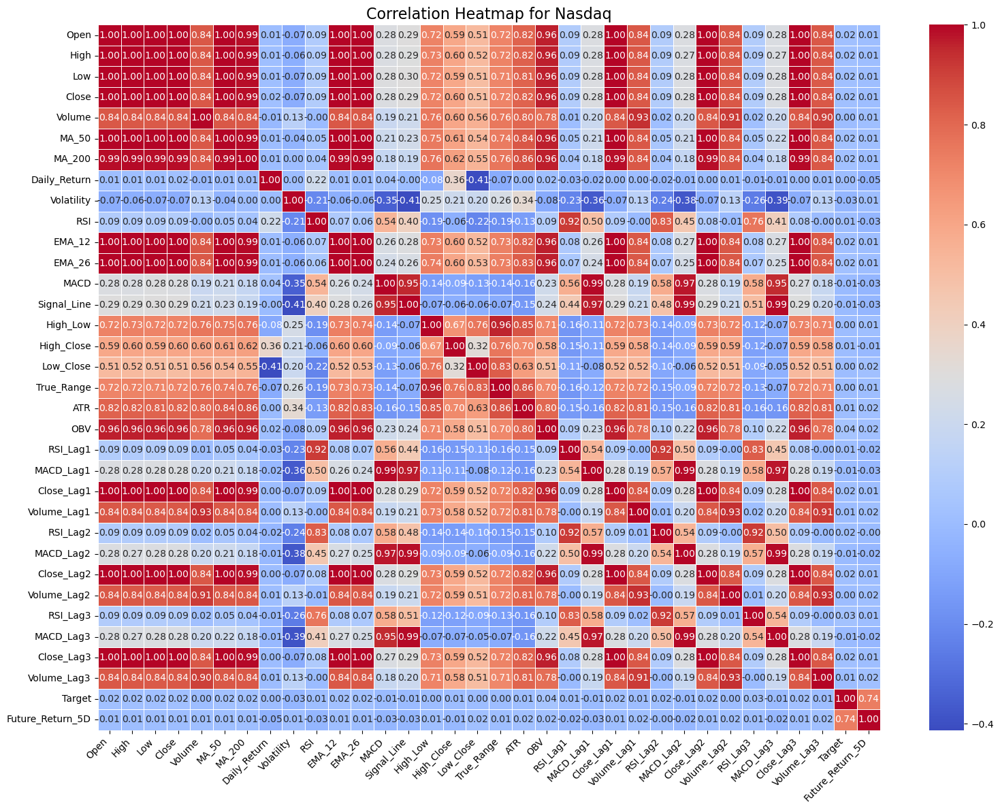


Analyzing correlation for Personal_Info


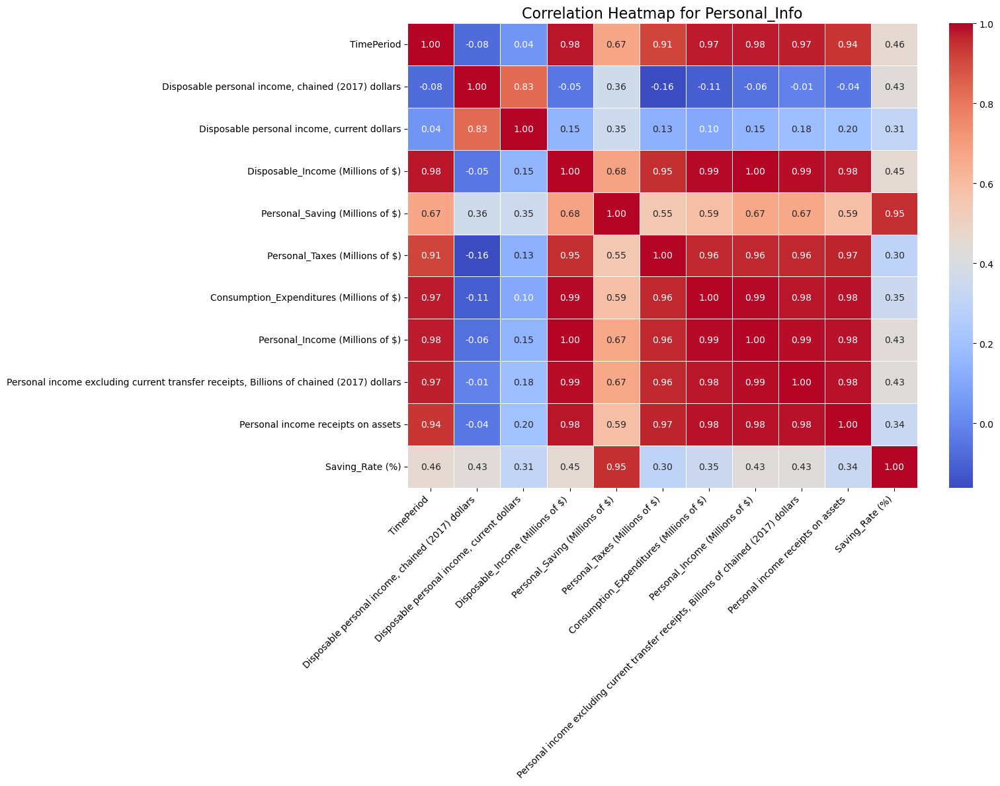


Analyzing correlation for SP500


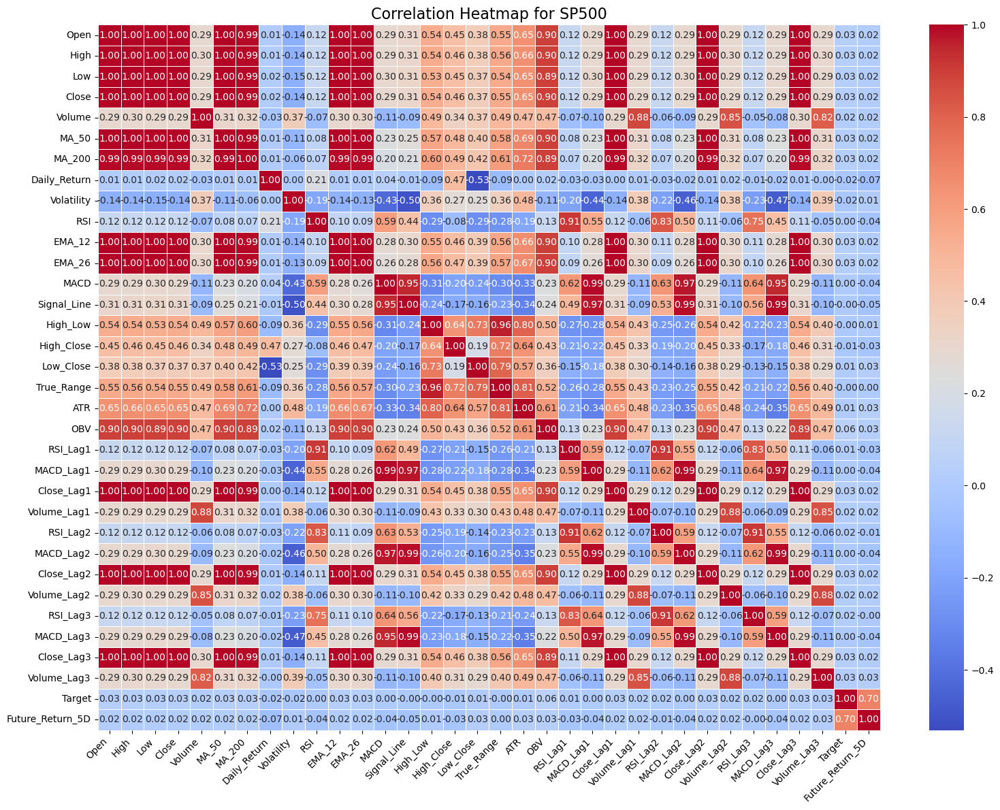

In [12]:
# Define a function to plot and save correlation heatmap
def plot_correlation_heatmap(df, table_name, save_path):
    # Create save directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)
    
    # Select numerical columns only
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    if len(numerical_columns) == 0:
        print(f"No numerical columns in {table_name}")
        return

    # Compute the correlation matrix
    corr_matrix = df[numerical_columns].corr()
    
    # Create and configure the plot
    plt.figure(figsize=(16, 12))
    heatmap = sns.heatmap(corr_matrix, 
                         annot=True, 
                         fmt=".2f", 
                         cmap="coolwarm", 
                         linewidths=0.5, 
                         annot_kws={"size": 10})
    
    plt.title(f"Correlation Heatmap for {table_name}", fontsize=16)
    plt.xticks(rotation=45, fontsize=10, ha='right')  # Added ha='right' for better label alignment
    plt.yticks(rotation=0, fontsize=10)
    
    # Adjust layout to prevent label cutoff
    plt.tight_layout()
    plt.show()

# Define the save path
save_path = "/Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data/visualized-data"

# Read the CSV files if dataframes is not defined
if 'dataframes' not in locals():
    dataframes = {}
    data_path = "/Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data"
    for file in os.listdir(data_path):
        if file.endswith('.csv'):
            name = os.path.splitext(file)[0]
            file_path = os.path.join(data_path, file)
            dataframes[name] = pd.read_csv(file_path)
            print(f"Loaded {file}")

# Generate and save heatmaps for each DataFrame
for name, df in dataframes.items():
    print(f"\nAnalyzing correlation for {name}")
    plot_correlation_heatmap(df, name, save_path)

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

def plot_target_distribution(df, save_path):
    # Create save directory if it doesn't exist
    os.makedirs(save_path, exist_ok=True)
    
    # Create the plot
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Target', data=df, palette='coolwarm')
    plt.title('Distribution of Target (Price Direction)', fontsize=14)
    plt.xlabel('Target (0: Down, 1: Up)', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    
    # Add count labels on top of each bar
    for i in plt.gca().containers:
        plt.gca().bar_label(i)
    
    # Calculate and display percentages
    total = len(df)
    for i, count in enumerate(df['Target'].value_counts()):
        percentage = count/total * 100
        plt.text(i, count, f'\n{percentage:.1f}%', 
                horizontalalignment='center', 
                fontsize=10)
    
    plt.tight_layout()
    
    # Save the plot
    save_file = os.path.join(save_path, 'target_distribution.png')
    plt.savefig(save_file, dpi=300, bbox_inches='tight')
    plt.close()
    plt.show()
    print(f"Saved target distribution plot to: {save_file}")
    
    # Print summary statistics
    print("\nTarget Distribution Summary:")
    print(df['Target'].value_counts(normalize=True).round(3) * 100)

# Define save path
save_path = "/Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data/visualized-data"

# Create and save the plot
plot_target_distribution(df, save_path)

/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/678134305.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Target', data=df, palette='coolwarm')


Saved target distribution plot to: /Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data/visualized-data/target_distribution.png

Target Distribution Summary:
Target
1    57.9
0    42.1
Name: proportion, dtype: float64


/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/587252943.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Target', y=feature, data=df, palette='pastel')


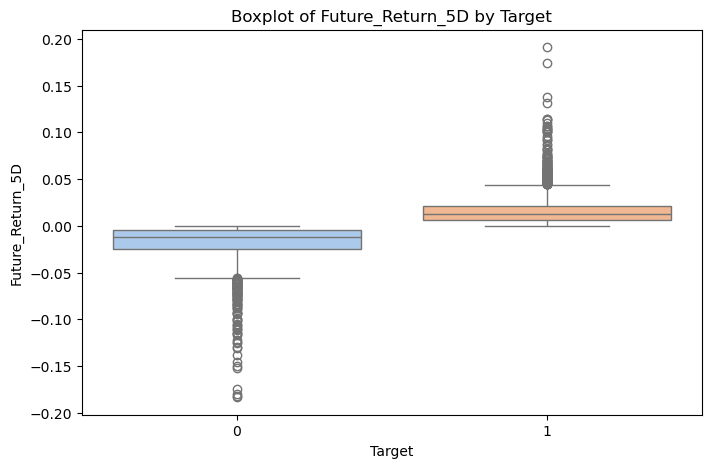

/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/587252943.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Target', y=feature, data=df, palette='pastel')


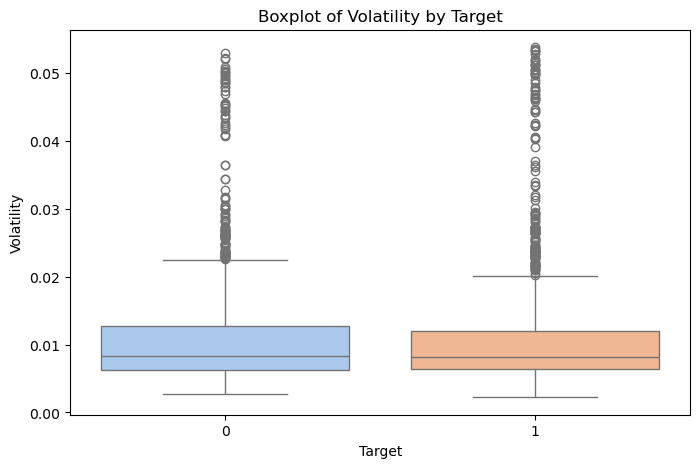

/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/587252943.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Target', y=feature, data=df, palette='pastel')


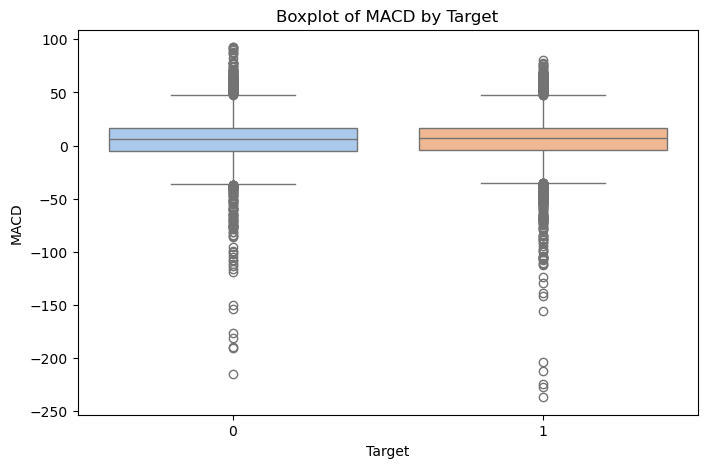

/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/587252943.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Target', y=feature, data=df, palette='pastel')


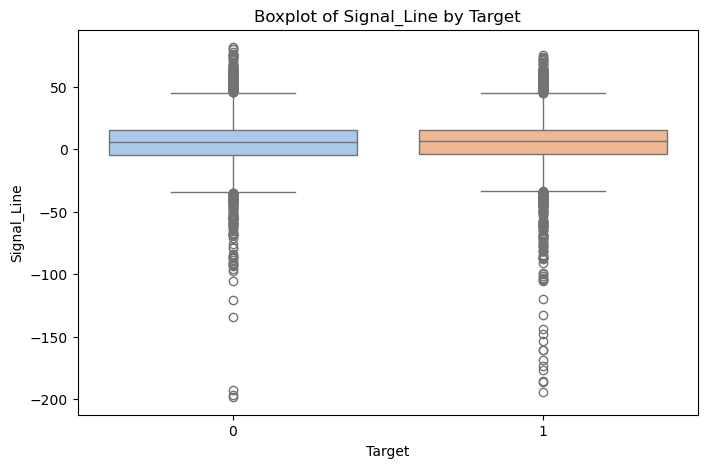

/var/folders/1z/n1k_hhl168s2rqld4kqxxr880000gn/T/ipykernel_90861/587252943.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Target', y=feature, data=df, palette='pastel')


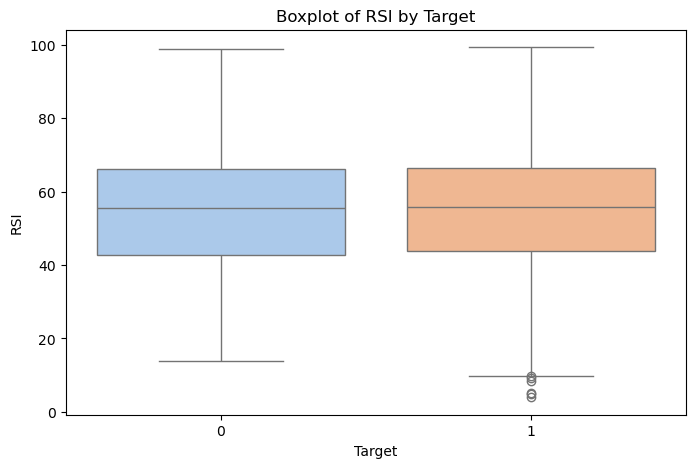

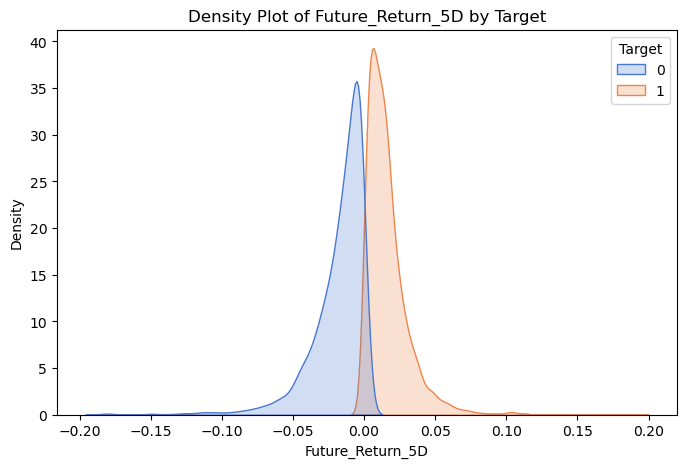

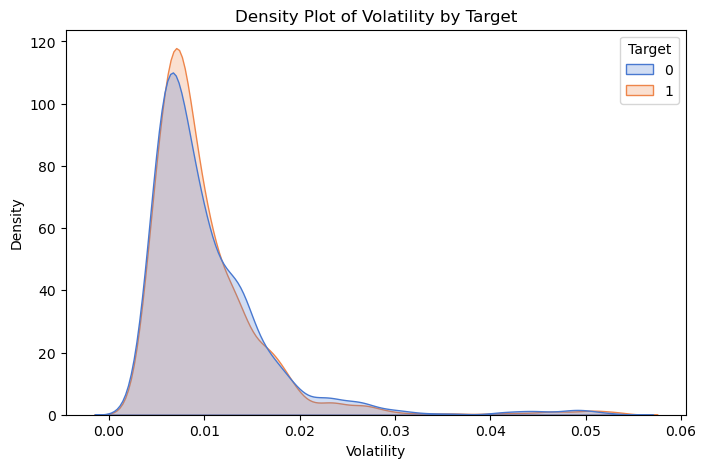

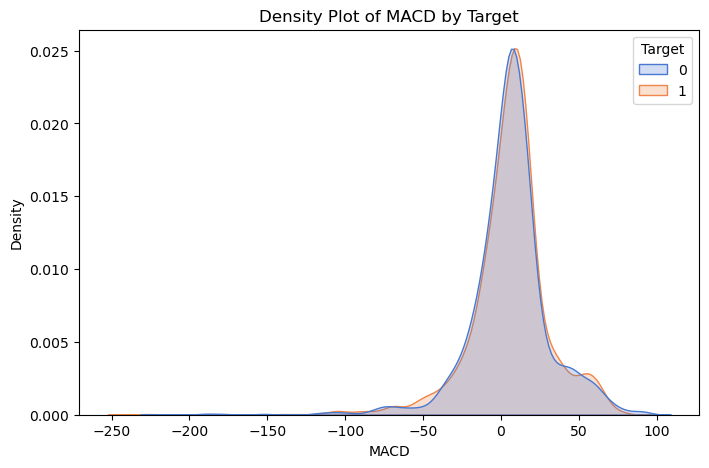

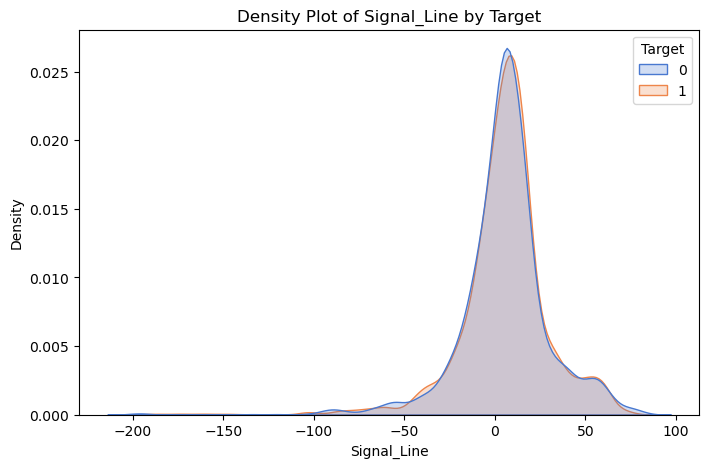

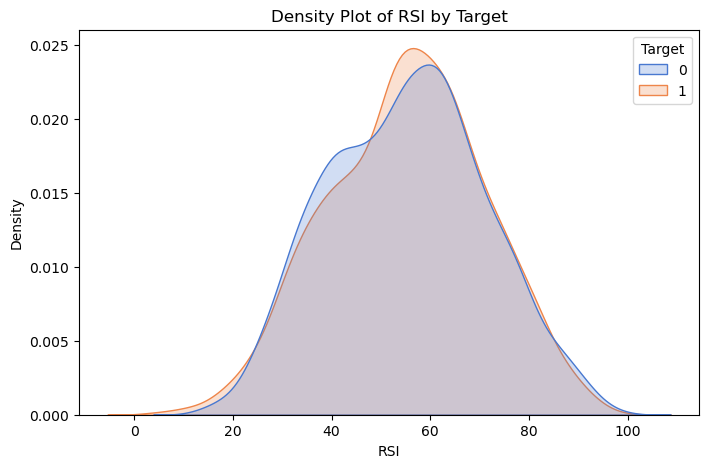

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# create save path
save_path = "/Users/qqmian/Desktop/GU_5000/Stock_Market_Performance/data/visualized-data"
os.makedirs(save_path, exist_ok=True)

top_features = ['Future_Return_5D', 'Volatility', 'MACD', 'Signal_Line', 'RSI']

# box plot
for feature in top_features:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x='Target', y=feature, data=df, palette='pastel')
    plt.title(f'Boxplot of {feature} by Target')
    save_file = os.path.join(save_path, f'{feature}_boxplot.png')
    plt.savefig(save_file, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

# density plots
for feature in top_features:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(data=df, x=feature, hue='Target', fill=True, common_norm=False, palette='muted')
    plt.title(f'Density Plot of {feature} by Target')
    save_file = os.path.join(save_path, f'{feature}_density.png')
    plt.savefig(save_file, dpi=300, bbox_inches='tight')
    plt.show()
    plt.close()

In [43]:
from scipy.stats import ttest_ind
import pandas as pd

# Define the target column
target_column = 'Target'  # Replace with the actual target column name in your dataset

# Initialize a list to store t-test results
t_test_results = []

# Perform t-test for each numerical column in each table
for name, df in dataframes.items():
    if target_column not in df.columns:
        print(f"{name} does not contain {target_column}, skipping...")
        continue

    # Select numerical columns
    numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns
    
    # Perform t-test for each numerical column
    for col in numerical_columns:
        group0 = df[df[target_column] == 0][col]
        group1 = df[df[target_column] == 1][col]
        
        # Perform t-test
        t_stat, p_value = ttest_ind(group0, group1, equal_var=False)
        
        # Append results to the list
        t_test_results.append({
            "Table": name,
            "Feature": col,
            "t-statistic": t_stat,
            "p-value": p_value
        })

# Convert results to a DataFrame
t_test_df = pd.DataFrame(t_test_results)

# Filter significant features (p-value < 0.05)
significant_features = t_test_df[t_test_df['p-value'] < 0.05]

# Sort by p-value for better readability
significant_features = significant_features.sort_values(by='p-value')

# Display significant features
print("Significant Features:")
print(significant_features)


Government_Spending does not contain Target, skipping...
Macro_Series does not contain Target, skipping...
Personal_Info does not contain Target, skipping...
Significant Features:
         Table           Feature  t-statistic   p-value
169      SP500  Future_Return_5D   -71.606147  0.000000
32   Crude_Oil            Target         -inf  0.000000
135     Nasdaq  Future_Return_5D   -80.888599  0.000000
33   Crude_Oil  Future_Return_5D   -52.942045  0.000000
134     Nasdaq            Target         -inf  0.000000
..         ...               ...          ...       ...
74        Gold            MA_200     2.100906  0.035694
73        Gold             MA_50     2.094097  0.036296
167      SP500       Volume_Lag3    -2.079218  0.037647
16   Crude_Oil         Low_Close     1.995997  0.045981
15   Crude_Oil        High_Close     1.966614  0.049275

[73 rows x 4 columns]


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)
/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occ

{{< include summary.qmd >}} 